# Cell Segmentation

This part shows how to use the function of cell segmentation. We provide two models here, deep cell model and the deep learning model developed by ourselves.


<div class="alert alert-info">

**Preparation**

Before **Cell Segmentation**, **Tissue Segmentation** or generating **mask file** from **ssDNA image** on **Cell Correction**, certain packages should be installed beforehand. **Cell Segmentation** version 3.0 don't need to install those python packages below see more details at **Deep Learning Model**.

Install necessary packages by running commands as below:

> &ensp;&ensp; **pip install tensorflow==2.7.0**  
> &ensp;&ensp; **pip install torch==1.10.0**  
> &ensp;&ensp; **pip install torchvision==0.11.1**  
> &ensp;&ensp; **pip install albumentations==0.4.6**

</div>

## About Tissue Segmentation

All processes of cell segmentation will perform tissue segmentation beforehand. You could specify the method by `tissue_seg_method` and the path to tissue segmentation model file by `tissue_seg_model_path`. We strongly recommend setting `tissue_seg_method=1` which is based on deep learning and is more effective, while 0 is based on OpenCV.

Download the [Tissue Segmentation Model](https://pan.genomics.cn/ucdisk/s/ai22e2).

More detail about [Tissue Segmentation](https://stereopy.readthedocs.io/en/latest/Tutorials/Tissue_Segmentation.html).

## About Tissue Segmentation

All processes of cell segmentation will perform tissue segmentation beforehand. You could specify the method by `tissue_seg_method` and the path to tissue segmentation model file by `tissue_seg_model_path`. We strongly recommend setting `tissue_seg_method=1` which is based on deep learning and is more effective, while 0 is based on OpenCV.

Download the [Tissue Segmentation Model](http://116.6.21.110:8090/share/dd965cba-7c1f-40b2-a275-0150890e005f).

More detail about [Tissue Segmentation](https://stereopy.readthedocs.io/en/latest/Tutorials/Tissue_Segmentation.html).

##  Deep Learning Model

In order to keep compatibility, we support two versions of `cell_seg` methods in `stereo.image` module.

### Deep Learning Model V3

New V3 model is upload to our [example_data/cell_segmetation](http://116.6.21.110:8090/share/dd965cba-7c1f-40b2-a275-0150890e005f) named `cell_segmetation_v3.0.onnx`. V3 method don't need to install heavy packages like `tensorflow`, `pytorch`, you can just import `cell_seg_v3` from `stereo.image`, ignoring the warning.

<div class="alert alert-info">

**Note**

If you don't need to perform tissue segmentation, you can set the `need_tissue_cut` parameter to `False` in the `cell_seg_v3` function.

</div>

In [2]:
from stereo import image as im

model_path = './cell_segmetation_v3.0.onnx'
img_path = './SS200000135TL_D1_regist.tif'
out_path = './SS200000135TL_D1_regist.cell_cut.tif'
tissue_seg_model_path = "./weight_tissue_cut_tool_220304.hdf5"
tissue_seg_method = 1

im.cell_seg_v3(model_path, img_path, out_path, need_tissue_cut=True, tissue_seg_model_path=tissue_seg_model_path, tissue_seg_method=1)

[2023-04-27 10:18:35][Stereo][27531][MainThread][140689697720128][pipeline][64][INFO]: source image type: ssdna
[2023-04-27 10:18:35][Stereo][27531][MainThread][140689697720128][pipeline][65][INFO]: segmentation method: intensity segmentation
[2023-04-27 10:18:35][Stereo][27531][MainThread][140689697720128][pipeline][171][INFO]: image loading and preprocessing...
[2023-04-27 10:18:35][Stereo][27531][MainThread][140689697720128][pipeline][200][INFO]: segment by intensity...
[2023-04-27 10:18:46][Stereo][27531][MainThread][140689697720128][pipeline][167][INFO]: seg results saved in ./stereopy/test/lyonlin/test_cell_seg
100%|██████████| 124/124 [2:04:07<00:00, 60.06s/it] 


### Deep Learning Model V1

First, please download the [deep learning model](http://116.6.21.110:8090/share/dd965cba-7c1f-40b2-a275-0150890e005f). It is assumed that the local storage path is `'./seg_model_20211210.pth'`. 

Besides, if you want to use GPU for prediction, set GPU id to the parameter `gpu`, if not, CPU will be used by default.

In [3]:
from stereo import image as im

model_path = './seg_model_20211210.pth'
img_path = './SS200000135TL_D1_regist.tif'
out_path = './cell_seg_res/'
tissue_seg_model_path = "./weight_tissue_cut_tool_220304.hdf5"
tissue_seg_method = 1

im.cell_seg(model_path, img_path, out_path, tissue_seg_model_path=tissue_seg_model_path, tissue_seg_method=1)

[2023-04-27 12:55:50][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][57][INFO]: Transform 16bit to 8bit : 0.00
[2023-04-27 12:55:50][Stereo][27531][MainThread][140689697720128][pipeline][64][INFO]: source image type: ssdna
[2023-04-27 12:55:50][Stereo][27531][MainThread][140689697720128][pipeline][65][INFO]: segmentation method: intensity segmentation
[2023-04-27 12:55:50][Stereo][27531][MainThread][140689697720128][pipeline][171][INFO]: image loading and preprocessing...
[2023-04-27 12:55:51][Stereo][27531][MainThread][140689697720128][pipeline][200][INFO]: segment by intensity...
[2023-04-27 12:56:04][Stereo][27531][MainThread][140689697720128][pipeline][167][INFO]: seg results saved in ./stereopy/test/lyonlin/test_cell_seg/cell_seg_res/
[2023-04-27 12:56:05][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][154][INFO]: get roi


【image 1/1】


100%|█████████████████████████████████████████| 180/180 [11:55<00:00,  3.98s/it]
[2023-04-27 13:08:52][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][321][INFO]: Cell inference : 746.64
[2023-04-27 13:10:41][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][330][INFO]: Post-processing : 109.68
[2023-04-27 13:11:19][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][333][INFO]: Result saved : ./stereopy/test/lyonlin/test_cell_seg/cell_seg_res/ 


## Deep Cell Model

Similarly download the [deep cell model](http://116.6.21.110:8090/share/dd965cba-7c1f-40b2-a275-0150890e005f) from our cloud disk. It is assumed that the local storage path is `'./models/deepcell/'`.

In [4]:
model_dir = './cell_segmentation_deepcell/'
img_path = './SS200000135TL_D1_regist.tif'
out_path = './deepcell/'
tissue_seg_model_path = "./weight_tissue_cut_tool_220304.hdf5"
tissue_seg_method = 1

im.cell_seg_deepcell(model_dir, img_path, out_path, tissue_seg_model_path=tissue_seg_model_path, tissue_seg_method=1)

[2023-04-27 13:49:11][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][47][INFO]: Create new dir : ./stereopy/test/lyonlin/test_cell_seg/cell_seg_res/deepcell/
[2023-04-27 13:49:11][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][52][INFO]: Transform 16bit to 8bit : 0.00
[2023-04-27 13:49:11][Stereo][27531][MainThread][140689697720128][pipeline][64][INFO]: source image type: ssdna
[2023-04-27 13:49:11][Stereo][27531][MainThread][140689697720128][pipeline][65][INFO]: segmentation method: intensity segmentation
[2023-04-27 13:49:11][Stereo][27531][MainThread][140689697720128][pipeline][171][INFO]: image loading and preprocessing...
[2023-04-27 13:49:12][Stereo][27531][MainThread][140689697720128][pipeline][200][INFO]: segment by intensity...
[2023-04-27 13:49:24][Stereo][27531][MainThread][140689697720128][pipeline][167][INFO]: seg results saved in ./stereopy/test/lyonlin/test_cell_seg/cell_seg_res/deepcell/
[2023-04-27 13:49:24][Stereo][27531][MainThread][14


【image 1/1】 batch:[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>]100%	1/1


[2023-04-27 13:58:00][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][303][INFO]: Cell inference : 495.68
[2023-04-27 13:58:00][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][308][INFO]: Filter by tissue mask : 0.29
[2023-04-27 13:58:00][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][313][INFO]: Mosaic tissue roi : 0.12
[2023-04-27 13:59:26][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][318][INFO]: Post-processing : 86.05
[2023-04-27 13:59:45][Stereo][27531][MainThread][140689697720128][cell_seg_pipeline][321][INFO]: Result saved : ./stereopy/test/lyonlin/test_cell_seg/cell_seg_res/deepcell/ 


After running the function, three result pictures will be generated in the out path directory.

    mask.tif: cell segmentation result

    outline.tif: cell boundary result

    score.tif: cell fraction result

We compared different cell segmentation algorithm models:

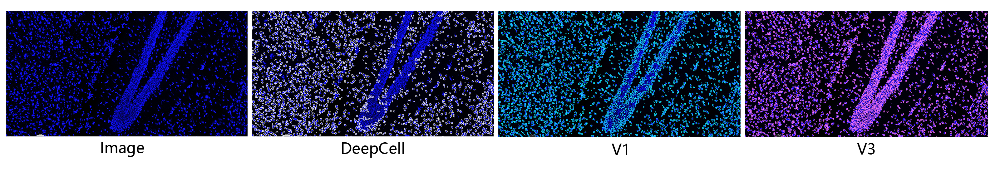

## New CGEF

After obtaining mask results through cell segmentation function, you can generate a cell bin GEF from the mask as well as the corresponding BGEF (including `SN.raw.gef`, `SN.gef`, `SN.tissue.gef`).

First, you need a BGEF , then refer to following example. Remember to specify the path of directory to save cell bin GEF by `cgef_out_dir`, the path of BGEF by `bgef_path` and the path of mask by `mask_path`.

It will return the path of cell bin GEF.

In [ ]:
from stereo.tools.cell_cut import CellCut

cgef_out_dir = "./cell_cut_out"
bgef_path = "../test_data/SS200000135TL_D1.raw.gef"
mask_path = "../test_data/SS200000135TL_D1_mask.tif"

cc = CellCut(cgef_out_dir=cgef_out_dir)
out_path = cc.cell_cut(bgef_path=bgef_path, mask_path=mask_path)

If only have GEM file, you could generate a new cell bin GEF based on it and the corresponding mask.

In [ ]:
from stereo.tools.cell_cut import CellCut

cgef_out_dir = "./cell_cut_out"
gem_path = "./SS200000135TL_D1.gem.gz"
mask_path = "./SS200000135TL_D1_mask.tif"

cc = CellCut(cgef_out_dir=cgef_out_dir)
out_path = cc.cell_cut(gem_path=gem_path, mask_path=mask_path)